In [1]:
pip install pymatgen -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from fastai import *
from fastai.vision.all import *

import sys
sys.path.append('..')
from src.band_plotters import *
from src.transforms import *
from src.TensorImageNoised import *
from src.ae_misc import predict

from autoencoder.resnet_autoencoder import model
from autoencoder import resnet_autoencoder
ResidualLayer = model.ResidualLayer



sys.modules['resnet_autoencoder'] = resnet_autoencoder

IMAGE_DIRECTORY = DATA_DIRECTORY/"images/grayscale_4ev_linewidth3/"

LATENT_CHANNELS=6


In [3]:
def log_cosh_loss(pred, targ, a):
    loss = (1/a) * torch.log(torch.cosh(a*(pred-targ)))
    
    return loss.mean()

def mse_loss(pred, targ):
    x_recon, mu, logvar = pred
    
    return 3.3*F.mse_loss(x_recon, targ) + 0.05 * kld_mean_loss(mu, logvar)

def bce_loss(pred, targ):
    x_recon, mu, logvar = pred
    
    return nn.BCEWithLogitsLoss()(x_recon, targ) + 0.05 * kld_mean_loss(mu, logvar)

def mse_recon_loss(pred, targ):
    x_recon, mu, logvar = pred
    
    return F.mse_loss(x_recon, targ)

In [4]:
learn = load_learner(f"../autoencoder/trained_models/vae_resnet18_size128_lossbcekl_randerase_channels{LATENT_CHANNELS}.pkl")

In [5]:
def predict(learn, item, rm_type_tfms=None, with_input=False):
    dl = learn.dls.test_dl([item], rm_type_tfms=rm_type_tfms, num_workers=0)
    inp,preds,_,dec_preds = learn.get_preds(dl=dl, with_input=True, with_decoded=True)
    return preds

torch.Size([1, 3, 128, 128])

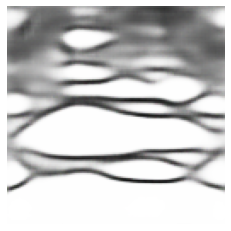

In [6]:
x_recon, mu, sigma = predict(learn, IMAGE_DIRECTORY/"2dm-2.png")
show_image(torch.sigmoid(x_recon[0]))
x_recon.size()

In [7]:
def generate_and_plot_image(mu_plus_variation, ax, sigmoid=False):
    z = mu_plus_variation.view(1, LATENT_CHANNELS, 4, 4)
    x_recon = learn.model.decoder(z)
    x_recon = x_recon.view(3, 128, 128)
    if sigmoid: x_recon = torch.sigmoid(x_recon)
    x_recon = torch.permute(x_recon, (1, 2, 0))
    ax.imshow(x_recon.cpu().detach().numpy())

In [8]:
def plot_input(image, learn):
    fig, ax = plt.subplots()
    dl = learn.dls.test_dl([image], rm_type_tfms=False, num_workers=0)
    x = dl.one_batch()
    x = torch.permute(x[0][0], (1, 2, 0))
    ax.imshow(x.cpu().detach().numpy())


0 / 480
1 / 481
2 / 482
3 / 483
4 / 484
5 / 485
6 / 486
7 / 487
8 / 488
9 / 489
10 / 490
11 / 491
12 / 492
13 / 493
14 / 494
15 / 495
16 / 496
17 / 497
18 / 498
19 / 499
20 / 500
21 / 501
22 / 502
23 / 503
24 / 504
25 / 505
26 / 506
27 / 507
28 / 508
29 / 509
30 / 510
31 / 511
32 / 512
33 / 513
34 / 514
35 / 515
36 / 516
37 / 517
38 / 518
39 / 519
40 / 520
41 / 521
42 / 522
43 / 523
44 / 524
45 / 525
46 / 526
47 / 527
48 / 528
49 / 529
50 / 530
51 / 531
52 / 532
53 / 533
54 / 534
55 / 535
56 / 536
57 / 537
58 / 538
59 / 539
60 / 540
61 / 541
62 / 542
63 / 543
64 / 544
65 / 545
66 / 546
67 / 547
68 / 548
69 / 549
70 / 550
71 / 551
72 / 552
73 / 553
74 / 554
75 / 555
76 / 556
77 / 557
78 / 558
79 / 559
80 / 560
81 / 561
82 / 562
83 / 563
84 / 564
85 / 565
86 / 566
87 / 567
88 / 568
89 / 569
90 / 570
91 / 571
92 / 572
93 / 573
94 / 574
95 / 575
96 / 576
97 / 577
98 / 578
99 / 579
100 / 580
101 / 581
102 / 582
103 / 583
104 / 584
105 / 585
106 / 586
107 / 587
108 / 588
109 / 589
110 / 590


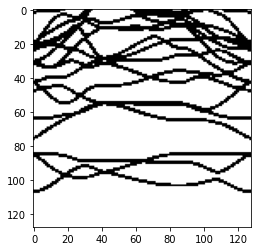

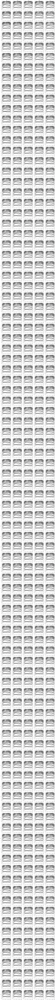

In [10]:
MAX_VARIATION = 0.5
NUM_TRAVERSE_STEPS = 5
z_dim = LATENT_CHANNELS*4*4

image = IMAGE_DIRECTORY/"2dm-2.png"
mu = predict(learn, image)[1]

plot_input(image, learn)

variation_from_mean = np.linspace(-MAX_VARIATION, MAX_VARIATION, NUM_TRAVERSE_STEPS)

fig, ax = plt.subplots(z_dim, NUM_TRAVERSE_STEPS, figsize=(NUM_TRAVERSE_STEPS*4, z_dim*4))

for i, variation in enumerate(variation_from_mean):
    ax[0, i].set_title(variation.item())

for j in range(z_dim):
    ax[j, 0].set_ylabel(j)

for dim in range(z_dim):
    for j, variation in enumerate(variation_from_mean):
        mu_plus_variation = mu.clone()
        mu_plus_variation[0, dim] += variation
        generate_and_plot_image(mu_plus_variation, ax[dim, j], sigmoid=True)
        print(dim*NUM_TRAVERSE_STEPS+j, "/", z_dim*NUM_TRAVERSE_STEPS)
        
fig.savefig("out.png")
plt.show()

In [13]:
x, mu, sigma = predict(learn, image)
mu,sigma

(tensor([[-2.5310e-02, -1.1171e+00, -1.2350e-03, -1.0878e+00, -2.5936e-02,
          -8.0433e-01, -1.2491e+00,  2.1983e-01, -2.6746e-02, -3.6127e-01,
           1.0987e+00, -3.8543e-01, -2.5598e-02,  1.9883e+00,  2.1517e+00,
           1.0159e+00, -7.4282e-03, -2.8051e-01,  2.1212e-01,  1.2246e-01,
          -6.7431e-03,  1.3444e+00, -6.4081e-01, -1.0462e+00, -5.8566e-03,
          -8.7368e-01, -8.8437e-01, -1.8990e+00, -7.1133e-03,  1.3630e+00,
          -1.2222e+00,  1.1312e+00, -5.7735e-03,  8.5450e-03,  1.5376e+00,
          -3.7980e-01, -7.5718e-03, -2.2577e-01,  1.3653e+00,  1.9536e+00,
          -9.8988e-03, -1.4676e-01,  1.5843e+00, -7.2003e-01, -6.6002e-03,
           3.4364e-01, -2.5144e-01,  1.0404e+00,  1.4947e-03, -8.2868e-04,
          -1.0731e-03, -1.3279e-03,  1.4957e-03, -5.1047e-04, -9.8485e-04,
          -5.5837e-04,  1.4969e-03, -5.9593e-04, -8.3447e-05, -1.6097e-03,
           1.4952e-03,  6.7151e-04, -1.1611e-04,  3.3516e-04,  1.0919e-03,
           7.7681e-05, -7